# Project 4.3 - Testing and Object Detector

This notebook implements testing and evaluation of the trained object detector.

## Tasks:
1. Apply the CNN that you trained on the test images
2. Implement and apply NMS to discard overlapping boxes
3. Evaluate the object detection output using Average Precision (AP)

In [1]:
# Imports
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from tqdm import tqdm

# Local modules
from model import create_model
from data_loader import PotholesDataset
from proposals import selective_search
from evaluation import compute_iou, compute_iou_matrix
from detector_dataset import get_transforms

%matplotlib inline
plt.rcParams['figure.figsize'] = [12, 8]

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: mps


In [2]:
# Configuration
DATA_DIR = "./potholes"
MODEL_PATH = "best_model.pth"

# Detection parameters
CONF_THRESHOLD = 0.5  # Confidence threshold for detections
NMS_THRESHOLD = 0.3   # IoU threshold for NMS
MAX_PROPOSALS = 2000  # Maximum proposals per image

# Check if model exists
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(
        f"Model not found: {MODEL_PATH}\n"
        "Please run Part 2 first to train the model."
    )

print("Configuration loaded")

Configuration loaded


## Task 1: Load Model and Test Data

In [3]:
# Load trained model
model = create_model(
    model_type='resnet18',
    num_classes=2,
    pretrained=False
)

checkpoint = torch.load(MODEL_PATH, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(device)
model.eval()

print(f"Loaded model from epoch {checkpoint['epoch']+1}")
print(f"Validation accuracy: {checkpoint['val_acc']:.4f}")

/Users/williampeytz/Documents/GitHub/DLCV4/venv/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/williampeytz/Documents/GitHub/DLCV4/venv/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Loaded model from epoch 4
Validation accuracy: 0.9320


In [4]:
# Load test dataset
test_dataset = PotholesDataset(DATA_DIR, split='test')
print(f"Test images: {len(test_dataset)}")

Test images: 133


In [5]:
# Get transforms for inference
transform = get_transforms(split='val')

## Task 2: Implement Non-Maximum Suppression (NMS)

NMS is used to discard overlapping bounding boxes, keeping only the best detection for each object.

In [6]:
def non_maximum_suppression(boxes, scores, iou_threshold=0.5):
    """
    Apply Non-Maximum Suppression to remove overlapping detections.
    
    Args:
        boxes: numpy array of shape (N, 4) with [x1, y1, x2, y2] format
        scores: numpy array of shape (N,) with confidence scores
        iou_threshold: IoU threshold for suppression
        
    Returns:
        keep_indices: list of indices to keep
    """
    if len(boxes) == 0:
        return []
    
    # Convert to numpy if needed
    boxes = np.array(boxes)
    scores = np.array(scores)
    
    # Get coordinates
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    
    # Compute areas
    areas = (x2 - x1) * (y2 - y1)
    
    # Sort by score (descending)
    order = scores.argsort()[::-1]
    
    keep = []
    
    while len(order) > 0:
        # Pick the box with highest score
        i = order[0]
        keep.append(i)
        
        if len(order) == 1:
            break
        
        # Compute IoU with remaining boxes
        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])
        
        w = np.maximum(0, xx2 - xx1)
        h = np.maximum(0, yy2 - yy1)
        
        intersection = w * h
        union = areas[i] + areas[order[1:]] - intersection
        iou = intersection / (union + 1e-6)
        
        # Keep boxes with IoU below threshold
        inds = np.where(iou <= iou_threshold)[0]
        order = order[inds + 1]  # +1 because we removed the first element
    
    return keep


# Test NMS
test_boxes = np.array([
    [100, 100, 200, 200],
    [110, 110, 210, 210],  # Overlapping with first
    [300, 300, 400, 400],  # Separate
])
test_scores = np.array([0.9, 0.8, 0.7])

keep = non_maximum_suppression(test_boxes, test_scores, iou_threshold=0.3)
print(f"NMS test: kept indices {keep} (expected [0, 2])")

NMS test: kept indices [np.int64(0), np.int64(2)] (expected [0, 2])


## Run Object Detection on Test Images

In [7]:
def detect_objects(image, model, transform, device, 
                   conf_threshold=0.5, nms_threshold=0.3, max_proposals=2000):
    """
    Run object detection on a single image.
    
    Args:
        image: numpy array (H, W, 3) in RGB
        model: trained classifier
        transform: image transforms
        device: torch device
        conf_threshold: confidence threshold for detections
        nms_threshold: IoU threshold for NMS
        max_proposals: maximum proposals to evaluate
        
    Returns:
        detections: list of [x1, y1, x2, y2, score]
    """
    # Generate proposals using selective search
    proposals = selective_search(image, mode='fast', resize_height=480)
    proposals = proposals[:max_proposals]
    
    if len(proposals) == 0:
        return []
    
    # Classify each proposal
    model.eval()
    scores = []
    
    # Process in batches for efficiency
    batch_size = 64
    all_probs = []
    
    with torch.no_grad():
        for i in range(0, len(proposals), batch_size):
            batch_proposals = proposals[i:i+batch_size]
            batch_crops = []
            
            for box in batch_proposals:
                x1, y1, x2, y2 = box
                crop = image[y1:y2, x1:x2]
                
                if crop.size == 0:
                    # Invalid crop, use zeros
                    crop = np.zeros((64, 64, 3), dtype=np.uint8)
                
                # Convert to PIL and apply transforms
                crop_pil = Image.fromarray(crop)
                crop_tensor = transform(crop_pil)
                batch_crops.append(crop_tensor)
            
            # Stack and classify
            batch_tensor = torch.stack(batch_crops).to(device)
            outputs = model(batch_tensor)
            probs = F.softmax(outputs, dim=1)
            
            # Get pothole probability (class 1)
            pothole_probs = probs[:, 1].cpu().numpy()
            all_probs.extend(pothole_probs)
    
    # Filter by confidence threshold
    detections = []
    for box, score in zip(proposals, all_probs):
        if score >= conf_threshold:
            detections.append(box + [score])
    
    if len(detections) == 0:
        return []
    
    # Apply NMS
    det_boxes = np.array([d[:4] for d in detections])
    det_scores = np.array([d[4] for d in detections])
    
    keep_indices = non_maximum_suppression(det_boxes, det_scores, nms_threshold)
    
    final_detections = [detections[i] for i in keep_indices]
    
    return final_detections

In [8]:
# Run detection on all test images
all_detections = {}  # image_id -> list of detections
all_ground_truths = {}  # image_id -> list of GT boxes

print(f"Running detection on {len(test_dataset)} test images...")

for idx in tqdm(range(len(test_dataset))):
    # Get image and ground truth
    image, gt_boxes, image_id = test_dataset.get_image_and_boxes(idx)
    
    # Run detection
    detections = detect_objects(
        image, model, transform, device,
        conf_threshold=CONF_THRESHOLD,
        nms_threshold=NMS_THRESHOLD,
        max_proposals=MAX_PROPOSALS
    )
    
    all_detections[image_id] = detections
    all_ground_truths[image_id] = gt_boxes

# Print statistics
total_detections = sum(len(d) for d in all_detections.values())
total_gt = sum(len(gt) for gt in all_ground_truths.values())
print(f"\nTotal detections: {total_detections}")
print(f"Total ground truth boxes: {total_gt}")
print(f"Average detections per image: {total_detections/len(test_dataset):.1f}")

Running detection on 133 test images...


100%|██████████| 133/133 [03:19<00:00,  1.50s/it]


Total detections: 1710
Total ground truth boxes: 355
Average detections per image: 12.9


## Visualize Detections

In [9]:
def visualize_detections(image, detections, gt_boxes, title=''):
    """
    Visualize detections and ground truth on an image.
    
    Args:
        image: numpy array (H, W, 3)
        detections: list of [x1, y1, x2, y2, score]
        gt_boxes: list of [x1, y1, x2, y2]
        title: plot title
    """
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    ax.imshow(image)
    
    # Draw ground truth (green)
    for box in gt_boxes:
        x1, y1, x2, y2 = box
        rect = patches.Rectangle(
            (x1, y1), x2-x1, y2-y1,
            linewidth=2, edgecolor='green', facecolor='none',
            linestyle='--', label='Ground Truth'
        )
        ax.add_patch(rect)
    
    # Draw detections (red)
    for det in detections:
        x1, y1, x2, y2, score = det
        rect = patches.Rectangle(
            (x1, y1), x2-x1, y2-y1,
            linewidth=2, edgecolor='red', facecolor='none',
            label='Detection'
        )
        ax.add_patch(rect)
        ax.text(x1, y1-5, f'{score:.2f}', color='red', fontsize=10,
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax.set_title(title)
    ax.axis('off')
    
    # Create legend
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='green', linestyle='--', label='Ground Truth'),
        Line2D([0], [0], color='red', label='Detection')
    ]
    ax.legend(handles=legend_elements, loc='upper right')
    
    plt.tight_layout()
    return fig

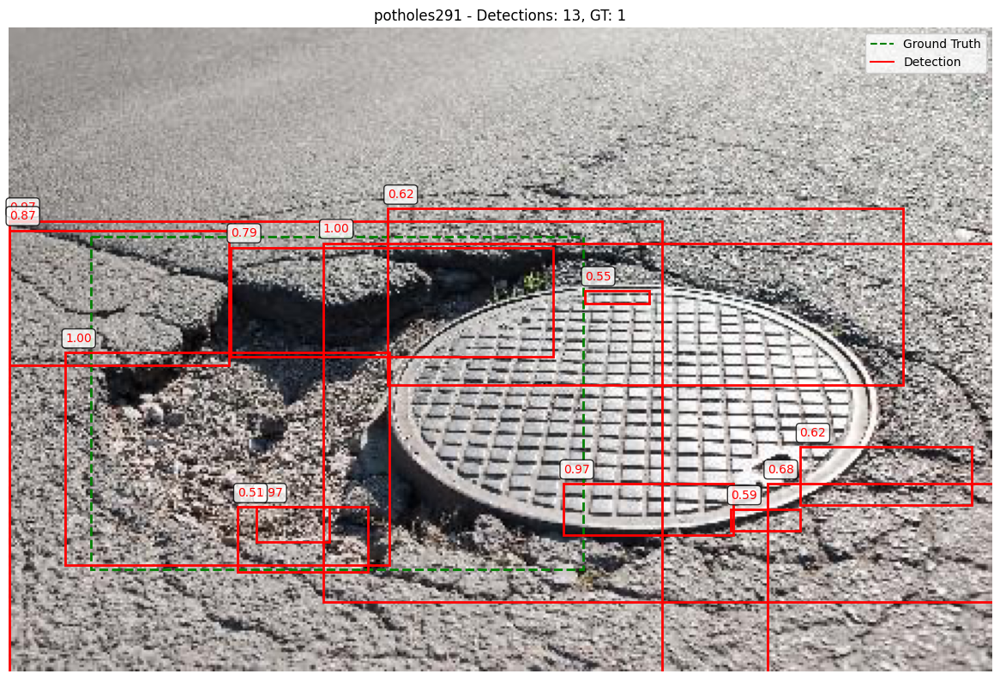

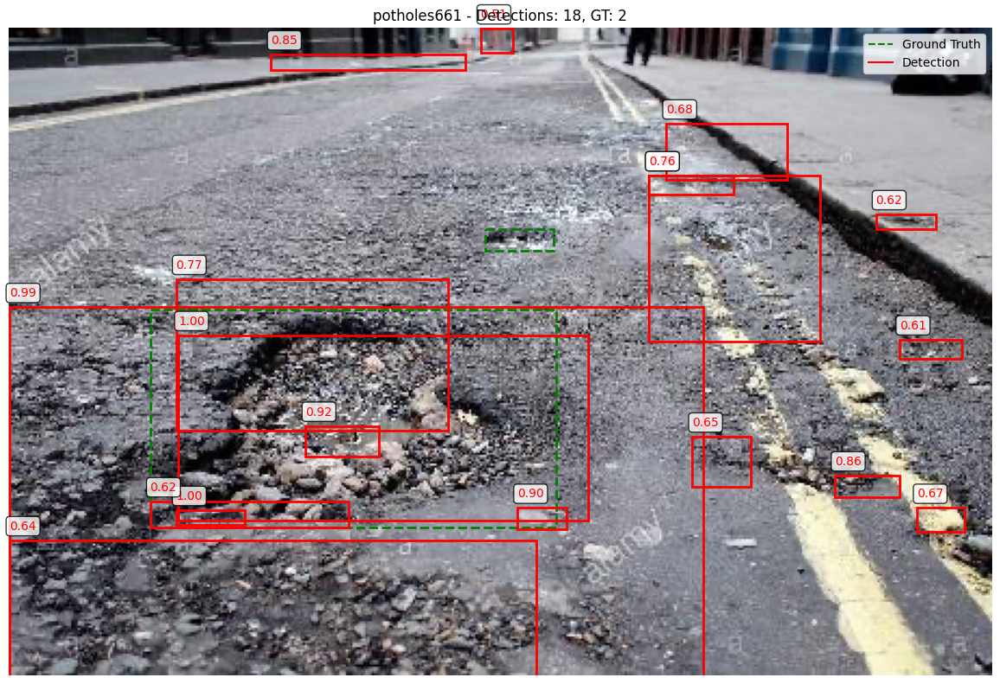

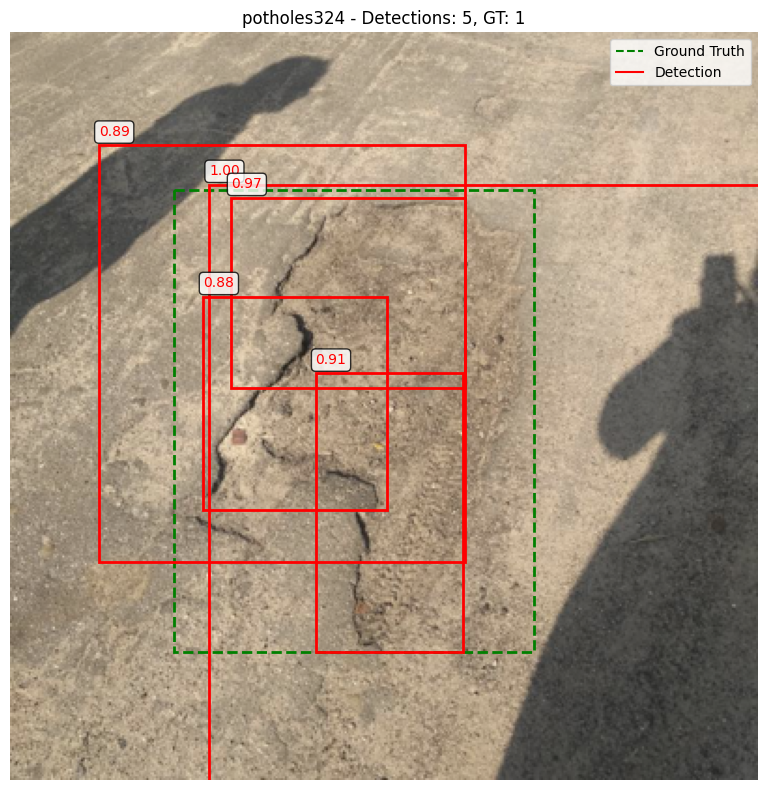

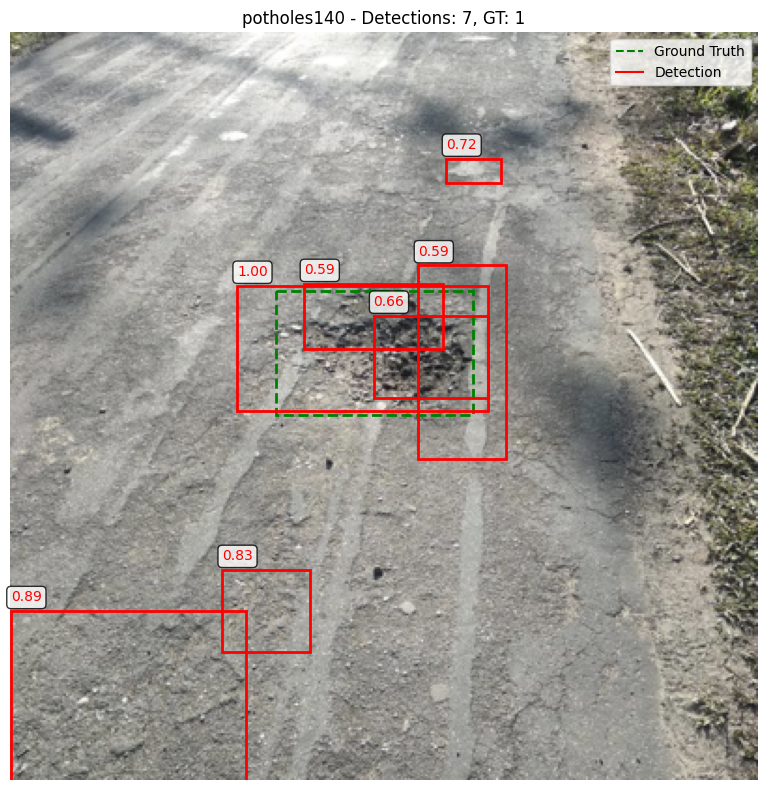

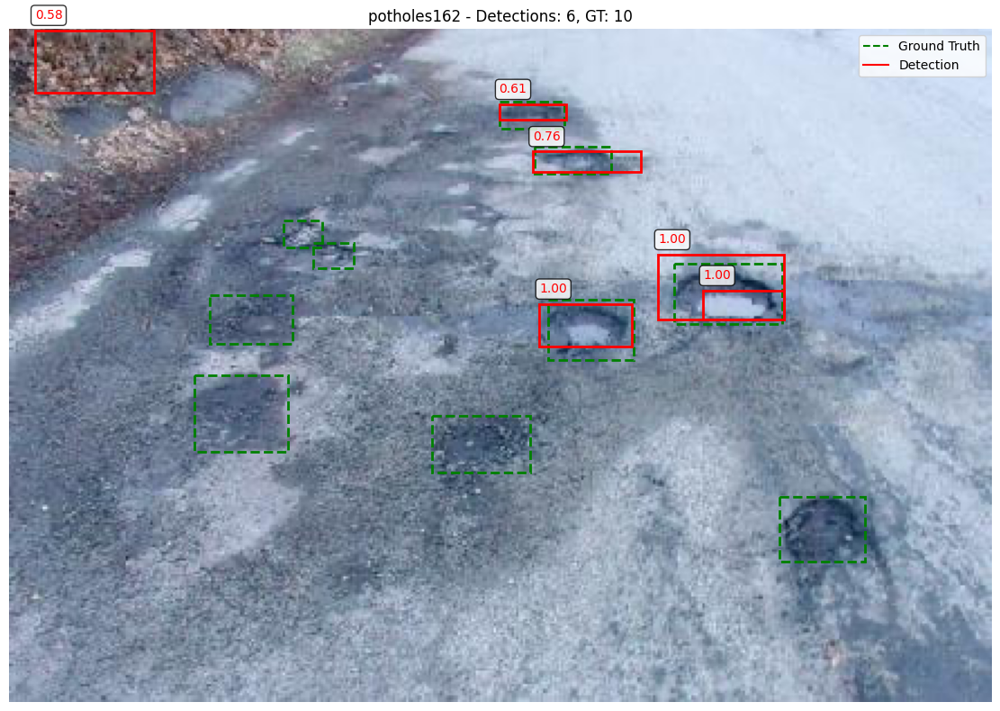

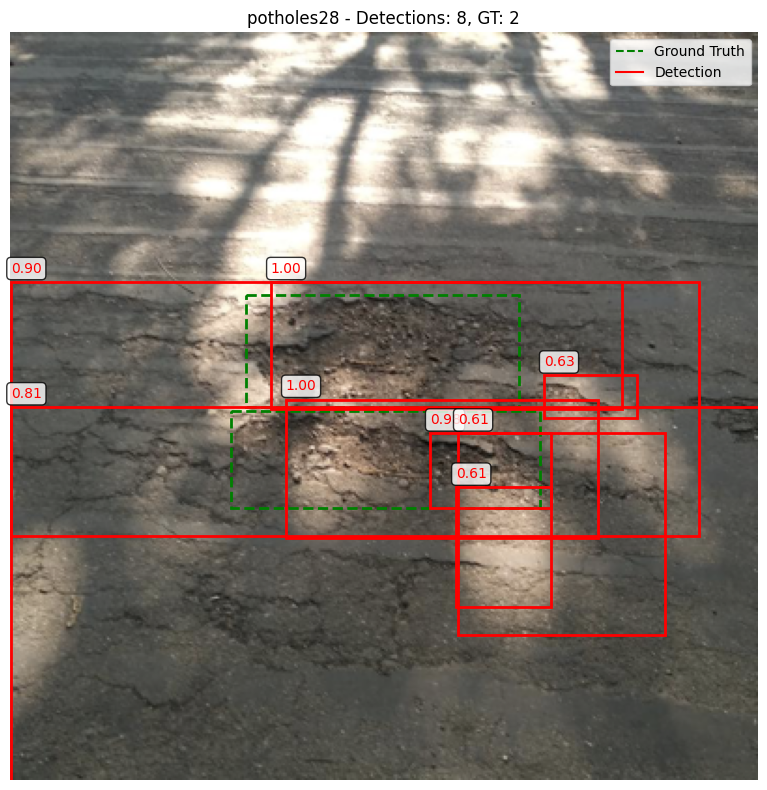

In [10]:
# Visualize some test results
n_samples = 6
sample_indices = np.random.choice(len(test_dataset), min(n_samples, len(test_dataset)), replace=False)

for idx in sample_indices:
    image, gt_boxes, image_id = test_dataset.get_image_and_boxes(idx)
    detections = all_detections[image_id]
    
    n_det = len(detections)
    n_gt = len(gt_boxes)
    
    fig = visualize_detections(
        image, detections, gt_boxes,
        title=f'{image_id} - Detections: {n_det}, GT: {n_gt}'
    )
    plt.show()

## Task 3: Evaluate with Average Precision (AP)

Average Precision is the standard metric for object detection. It summarizes the precision-recall curve into a single value.

In [11]:
def compute_ap(all_detections, all_ground_truths, iou_threshold=0.5):
    """
    Compute Average Precision for object detection.
    
    Args:
        all_detections: dict mapping image_id to list of [x1, y1, x2, y2, score]
        all_ground_truths: dict mapping image_id to list of [x1, y1, x2, y2]
        iou_threshold: IoU threshold for true positive
        
    Returns:
        ap: Average Precision value
        precision: precision values at each threshold
        recall: recall values at each threshold
    """
    # Collect all detections with their scores and image ids
    all_dets = []  # [(image_id, box, score)]
    
    for image_id, detections in all_detections.items():
        for det in detections:
            box = det[:4]
            score = det[4]
            all_dets.append((image_id, box, score))
    
    # Sort by confidence (descending)
    all_dets.sort(key=lambda x: x[2], reverse=True)
    
    # Count total ground truth boxes
    n_gt_total = sum(len(gt) for gt in all_ground_truths.values())
    
    if n_gt_total == 0:
        return 0.0, [], []
    
    # Track which GT boxes have been matched
    gt_matched = {img_id: [False] * len(boxes) 
                  for img_id, boxes in all_ground_truths.items()}
    
    # Compute TP and FP for each detection
    tp = np.zeros(len(all_dets))
    fp = np.zeros(len(all_dets))
    
    for i, (image_id, det_box, score) in enumerate(all_dets):
        gt_boxes = all_ground_truths.get(image_id, [])
        
        if len(gt_boxes) == 0:
            fp[i] = 1
            continue
        
        # Find best matching GT box
        best_iou = 0
        best_gt_idx = -1
        
        for gt_idx, gt_box in enumerate(gt_boxes):
            iou = compute_iou(det_box, gt_box)
            if iou > best_iou:
                best_iou = iou
                best_gt_idx = gt_idx
        
        # Check if this is a true positive
        if best_iou >= iou_threshold and not gt_matched[image_id][best_gt_idx]:
            tp[i] = 1
            gt_matched[image_id][best_gt_idx] = True
        else:
            fp[i] = 1
    
    # Compute cumulative TP and FP
    tp_cumsum = np.cumsum(tp)
    fp_cumsum = np.cumsum(fp)
    
    # Compute precision and recall
    precision = tp_cumsum / (tp_cumsum + fp_cumsum + 1e-6)
    recall = tp_cumsum / n_gt_total
    
    # Compute AP using 11-point interpolation (PASCAL VOC style)
    ap = 0
    for t in np.arange(0, 1.1, 0.1):
        # Find max precision at recall >= t
        prec_at_rec = precision[recall >= t]
        if len(prec_at_rec) > 0:
            ap += np.max(prec_at_rec)
    ap = ap / 11
    
    return ap, precision, recall

In [12]:
# Compute AP at different IoU thresholds
iou_thresholds = [0.3, 0.5, 0.7]

print("Average Precision Results:")
print("=" * 40)

results = {}
for iou_thresh in iou_thresholds:
    ap, precision, recall = compute_ap(all_detections, all_ground_truths, iou_threshold=iou_thresh)
    results[iou_thresh] = {'ap': ap, 'precision': precision, 'recall': recall}
    print(f"AP @ IoU={iou_thresh}: {ap:.4f}")

# Main AP at IoU=0.5
print("\n" + "=" * 40)
print(f"Main AP (IoU=0.5): {results[0.5]['ap']:.4f}")

Average Precision Results:
AP @ IoU=0.3: 0.5440
AP @ IoU=0.5: 0.4389
AP @ IoU=0.7: 0.1732

Main AP (IoU=0.5): 0.4389


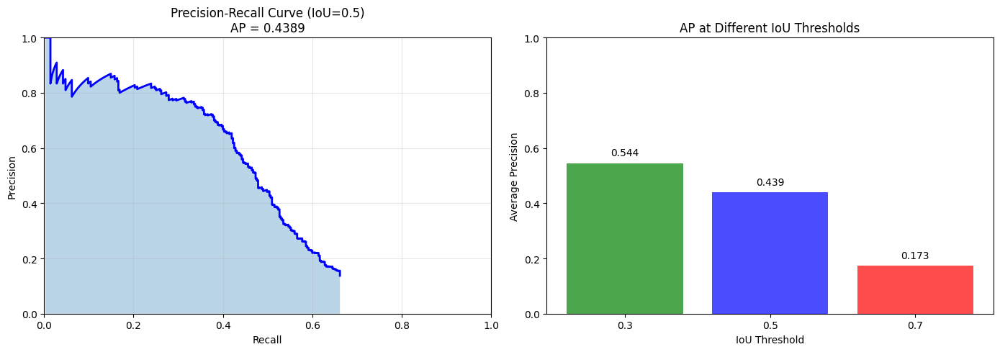

In [13]:
# Plot Precision-Recall curve
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# PR curve for IoU=0.5
ax = axes[0]
precision = results[0.5]['precision']
recall = results[0.5]['recall']

if len(precision) > 0:
    ax.plot(recall, precision, 'b-', linewidth=2)
    ax.fill_between(recall, precision, alpha=0.3)
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')
ax.set_title(f'Precision-Recall Curve (IoU=0.5)\nAP = {results[0.5]["ap"]:.4f}')
ax.set_xlim([0, 1])
ax.set_ylim([0, 1])
ax.grid(True, alpha=0.3)

# AP at different IoU thresholds
ax = axes[1]
aps = [results[t]['ap'] for t in iou_thresholds]
ax.bar([str(t) for t in iou_thresholds], aps, color=['green', 'blue', 'red'], alpha=0.7)
ax.set_xlabel('IoU Threshold')
ax.set_ylabel('Average Precision')
ax.set_title('AP at Different IoU Thresholds')
ax.set_ylim([0, 1])

# Add value labels on bars
for i, (t, ap) in enumerate(zip(iou_thresholds, aps)):
    ax.text(i, ap + 0.02, f'{ap:.3f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

## Additional Analysis

In [14]:
# Analyze detection errors
def analyze_errors(all_detections, all_ground_truths, iou_threshold=0.5):
    """
    Analyze detection errors.
    
    Returns:
        stats: dict with error analysis
    """
    total_tp = 0
    total_fp = 0
    total_fn = 0
    total_gt = 0
    total_det = 0
    
    for image_id in all_ground_truths.keys():
        gt_boxes = all_ground_truths[image_id]
        detections = all_detections.get(image_id, [])
        
        total_gt += len(gt_boxes)
        total_det += len(detections)
        
        # Track matched GT
        gt_matched = [False] * len(gt_boxes)
        
        # For each detection, find best GT match
        for det in detections:
            det_box = det[:4]
            best_iou = 0
            best_idx = -1
            
            for i, gt_box in enumerate(gt_boxes):
                iou = compute_iou(det_box, gt_box)
                if iou > best_iou:
                    best_iou = iou
                    best_idx = i
            
            if best_iou >= iou_threshold and not gt_matched[best_idx]:
                total_tp += 1
                gt_matched[best_idx] = True
            else:
                total_fp += 1
        
        # Count missed GT (false negatives)
        total_fn += sum(1 for m in gt_matched if not m)
    
    precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0
    recall = total_tp / total_gt if total_gt > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    
    return {
        'true_positives': total_tp,
        'false_positives': total_fp,
        'false_negatives': total_fn,
        'total_gt': total_gt,
        'total_detections': total_det,
        'precision': precision,
        'recall': recall,
        'f1_score': f1
    }

# Run error analysis
stats = analyze_errors(all_detections, all_ground_truths, iou_threshold=0.5)

print("\nDetection Error Analysis (IoU=0.5):")
print("=" * 40)
print(f"True Positives:  {stats['true_positives']}")
print(f"False Positives: {stats['false_positives']}")
print(f"False Negatives: {stats['false_negatives']}")
print(f"\nTotal GT boxes:  {stats['total_gt']}")
print(f"Total detections: {stats['total_detections']}")
print(f"\nPrecision: {stats['precision']:.4f}")
print(f"Recall:    {stats['recall']:.4f}")
print(f"F1 Score:  {stats['f1_score']:.4f}")


Detection Error Analysis (IoU=0.5):
True Positives:  235
False Positives: 1475
False Negatives: 120

Total GT boxes:  355
Total detections: 1710

Precision: 0.1374
Recall:    0.6620
F1 Score:  0.2276



Best detections (highest F1):


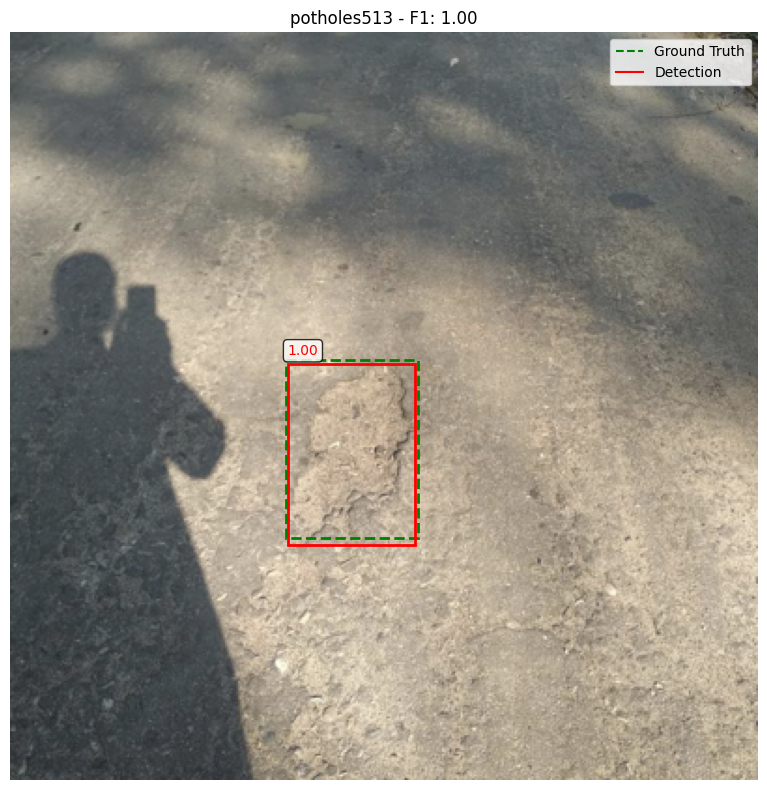

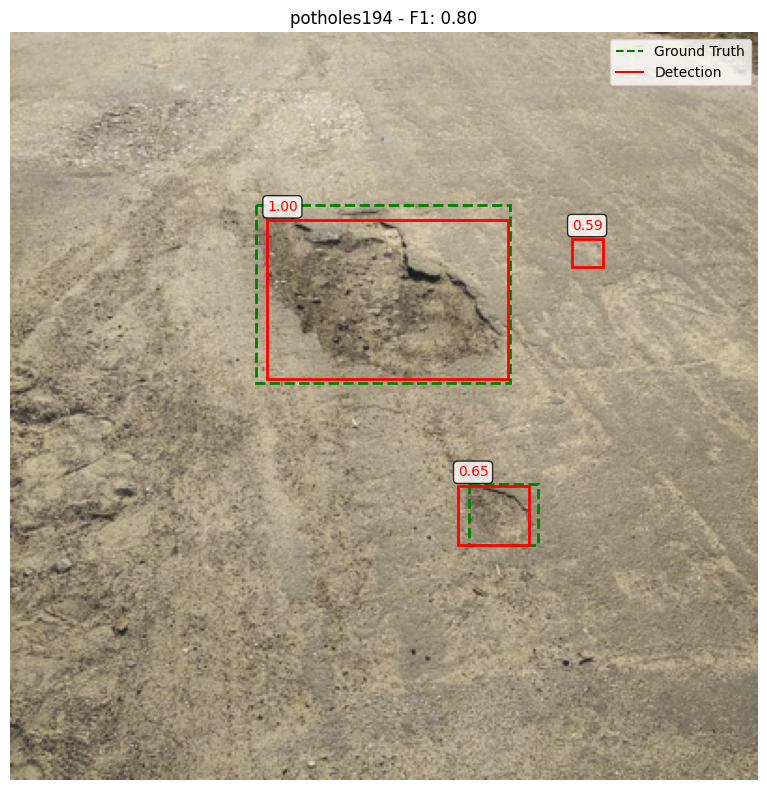

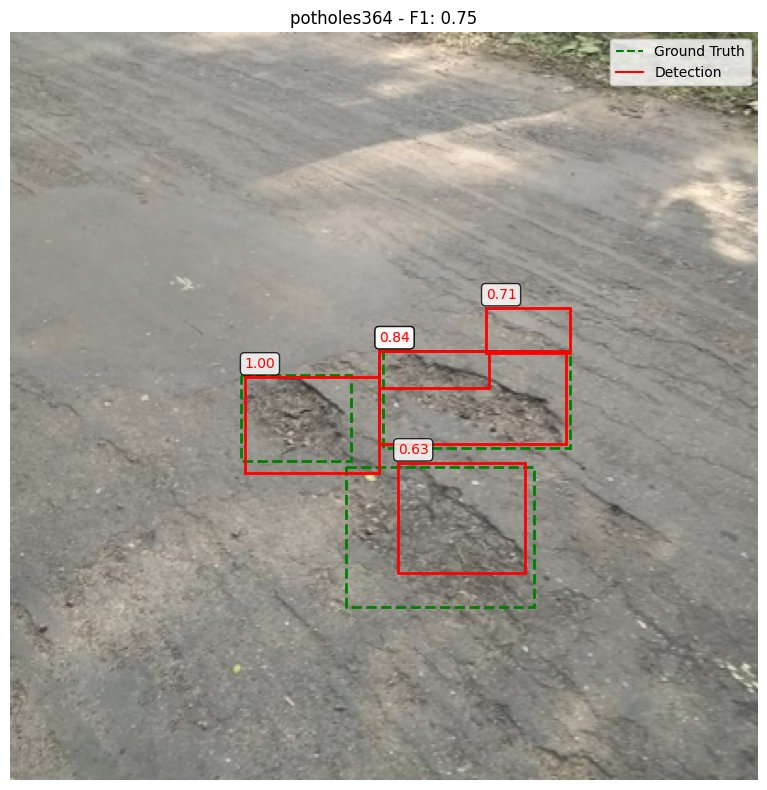


Worst detections (lowest F1):


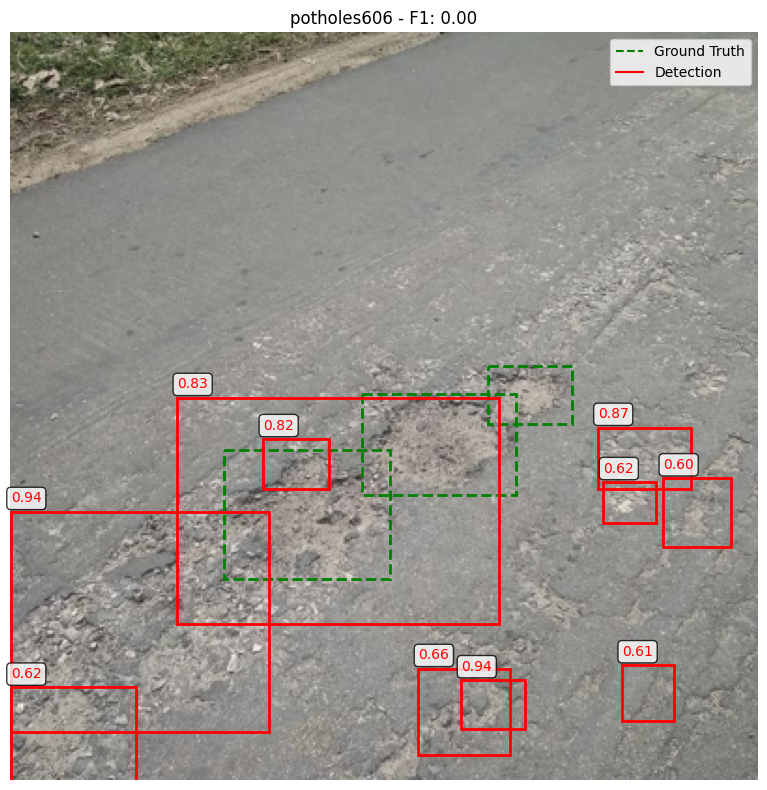

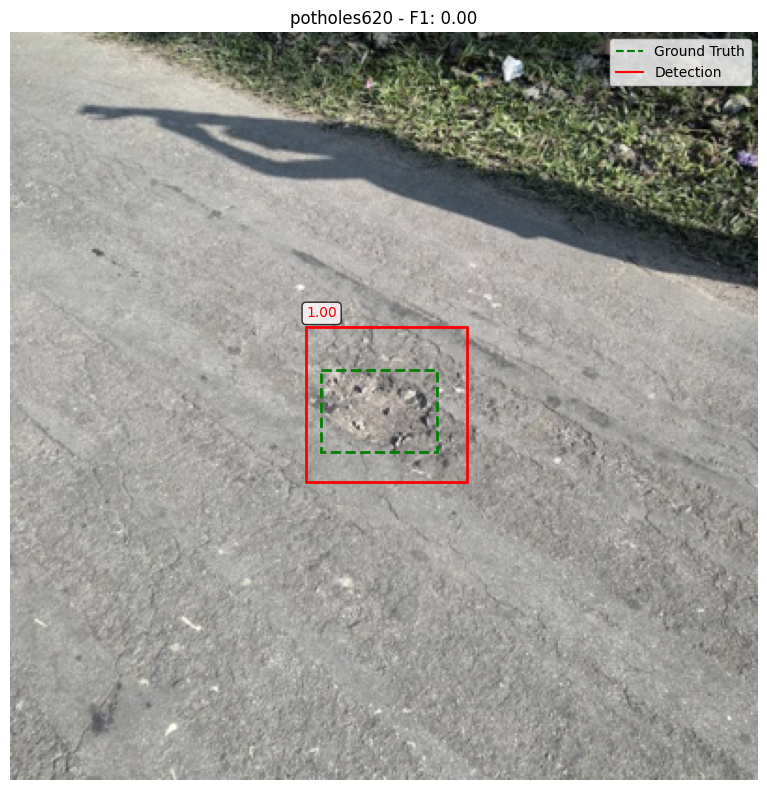

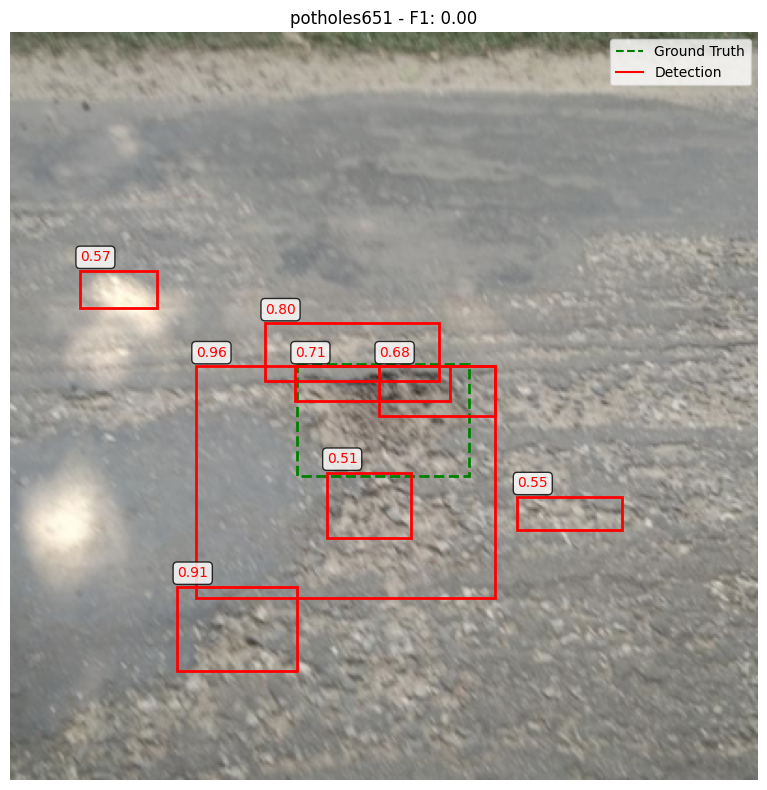

In [15]:
# Visualize best and worst detections
def compute_image_score(image_id, all_detections, all_ground_truths, iou_threshold=0.5):
    """Compute detection score for a single image."""
    gt_boxes = all_ground_truths[image_id]
    detections = all_detections.get(image_id, [])
    
    if len(gt_boxes) == 0:
        return 1.0 if len(detections) == 0 else 0.0
    
    gt_matched = [False] * len(gt_boxes)
    tp = 0
    
    for det in detections:
        det_box = det[:4]
        best_iou = 0
        best_idx = -1
        
        for i, gt_box in enumerate(gt_boxes):
            iou = compute_iou(det_box, gt_box)
            if iou > best_iou:
                best_iou = iou
                best_idx = i
        
        if best_iou >= iou_threshold and not gt_matched[best_idx]:
            tp += 1
            gt_matched[best_idx] = True
    
    # F1-like score
    precision = tp / len(detections) if len(detections) > 0 else 0
    recall = tp / len(gt_boxes)
    
    if precision + recall > 0:
        return 2 * precision * recall / (precision + recall)
    return 0

# Score all images
image_scores = []
for idx in range(len(test_dataset)):
    image_id = test_dataset.image_ids[idx]
    score = compute_image_score(image_id, all_detections, all_ground_truths)
    image_scores.append((idx, image_id, score))

# Sort by score
image_scores.sort(key=lambda x: x[2], reverse=True)

# Visualize best and worst
print("\nBest detections (highest F1):")
for idx, image_id, score in image_scores[:3]:
    image, gt_boxes, _ = test_dataset.get_image_and_boxes(idx)
    detections = all_detections[image_id]
    
    fig = visualize_detections(
        image, detections, gt_boxes,
        title=f'{image_id} - F1: {score:.2f}'
    )
    plt.show()

print("\nWorst detections (lowest F1):")
for idx, image_id, score in image_scores[-3:]:
    image, gt_boxes, _ = test_dataset.get_image_and_boxes(idx)
    detections = all_detections[image_id]
    
    fig = visualize_detections(
        image, detections, gt_boxes,
        title=f'{image_id} - F1: {score:.2f}'
    )
    plt.show()

## Effect of Confidence Threshold

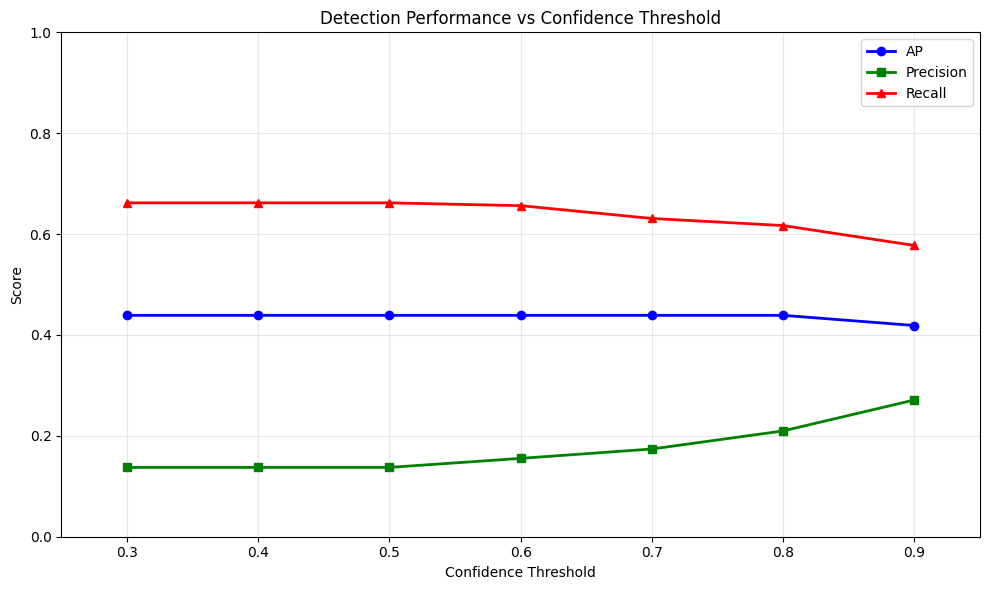

In [16]:
# Analyze effect of different confidence thresholds
# Note: This uses the scores we already computed, just varies the threshold

def filter_detections_by_conf(all_detections, conf_threshold):
    """Filter detections by confidence threshold."""
    filtered = {}
    for image_id, dets in all_detections.items():
        filtered[image_id] = [d for d in dets if d[4] >= conf_threshold]
    return filtered

conf_thresholds = [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
metrics = {'conf': [], 'ap': [], 'precision': [], 'recall': []}

for conf in conf_thresholds:
    filtered_dets = filter_detections_by_conf(all_detections, conf)
    ap, _, _ = compute_ap(filtered_dets, all_ground_truths, iou_threshold=0.5)
    stats = analyze_errors(filtered_dets, all_ground_truths, iou_threshold=0.5)
    
    metrics['conf'].append(conf)
    metrics['ap'].append(ap)
    metrics['precision'].append(stats['precision'])
    metrics['recall'].append(stats['recall'])

# Plot
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

ax.plot(metrics['conf'], metrics['ap'], 'b-o', label='AP', linewidth=2)
ax.plot(metrics['conf'], metrics['precision'], 'g-s', label='Precision', linewidth=2)
ax.plot(metrics['conf'], metrics['recall'], 'r-^', label='Recall', linewidth=2)

ax.set_xlabel('Confidence Threshold')
ax.set_ylabel('Score')
ax.set_title('Detection Performance vs Confidence Threshold')
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xlim([0.25, 0.95])
ax.set_ylim([0, 1])

plt.tight_layout()
plt.show()

## Summary

In this notebook, we:

1. **Applied the trained CNN on test images**: Generated proposals using Selective Search and classified them with our trained model

2. **Implemented Non-Maximum Suppression (NMS)**: Removed overlapping bounding boxes, keeping only the highest-confidence detection for each object

3. **Evaluated using Average Precision (AP)**: Computed AP at different IoU thresholds to measure detection performance

### Key Results:
- AP @ IoU=0.5: [FILL IN FROM RESULTS]
- Precision: [FILL IN]
- Recall: [FILL IN]

### Observations:
- [Add your observations about the detector's performance]
- [Note any failure cases or limitations]
- [Discuss the precision-recall trade-off]